<h1>Detection of drainage channel networks on digital satellite images</h1>



Our goal here is to figure out the drainage detection channel  using satellite images. The satellite images have a lot of noise so we will have to thruoghly clean the image or atleast highlight the contours to do requried detection. So we use image processing techniques

The following process is followd


1.   Contrast streching using histogram equalizaiotn
2.   Then we highlight the edges further using edge enhancement techniques
3.   Next we do edge detection
4.   And lastly we use skeletalization 



I032- Brshank Negi

I036- Aaryan Pasha

I040-Hansin Patwa

I081-Anirudh Kulkarni

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path2='/content/drive/MyDrive/Sem 4/Projects/SIP/sattalite2.jpg'

In [ ]:
img2=cv2.imread(path2,0)
img2.shape

(490, 600)

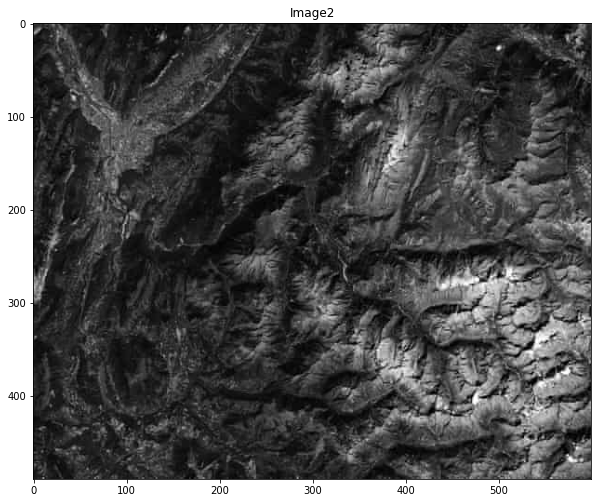

In [ ]:
plt.figure(figsize=(10,10))
plt.title("Image2")
plt.imshow(img2,cmap='gray')

In [ ]:
def genHistogram(img):
  index,count=np.unique(img,return_counts=True)#using function unique to count the apperence of each unique value
  max=2**(int(np.ceil(np.log2(img.max()))))#defining max intensity
  plot=np.zeros(max)#container to store the count values
  for i in range(max):
    if i in index:
      plot[i]=count[np.where(index==i)[0][0]]#genrating an array with value range of 0 to max where if a intensity value does not exisist then the value is 0
  return np.array([range(max),plot])#returning an array with the first column being the intensity val and the 2nd column being the frequency

In [ ]:
def equalization(img):
  data=genHistogram(img)#genrating count
  #equilizing the imgae
  sk=data[1]
  rk=data[0]
  p=sk/sk.sum()
  cdf=np.zeros(sk.shape)
  cdf[0]=p[0]
  for i in range(1,sk.shape[0]):
    cdf[i]=cdf[i-1]+p[i]
  newSk=cdf*(sk.shape[0]-1)
  newImg=img2.copy()
  final=pd.DataFrame(np.array([rk,sk,p,cdf,newSk.round()]).transpose(),columns=['rk','sk','p','cdf','newSk'])#encompasing the data in a dataframe
  for i in final.rk:
    newImg[img==i]=final.newSk[final.rk[final.rk==i]]#changing values of pixels in new image according to equilization where if val=i then change to newSK
  return newImg

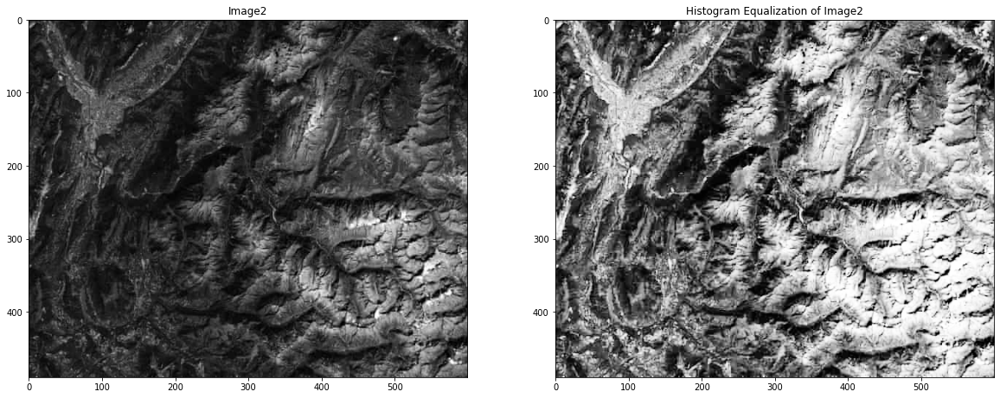

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.title("Image2")
plt.imshow(img2,cmap='gray',vmin=0,vmax=255)
plt.subplot(1,2,2)
EqualizedImage2=equalization(img2)
plt.title("Histogram Equalization of Image2")
plt.imshow(EqualizedImage2,cmap='gray',vmin=0,vmax=255)

In [ ]:
def EdgeEnhancement(img):
  #img2=img.copy()
  img2=np.zeros(img.shape)
  filter=np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])#Enhancement Filter
  for i in range(1,img.shape[0]-1):
    for j in range(1,img.shape[1]-1):
      img2[i,j]=np.multiply(img[i-1:i+2,j-1:j+2],filter).sum()
  return img2

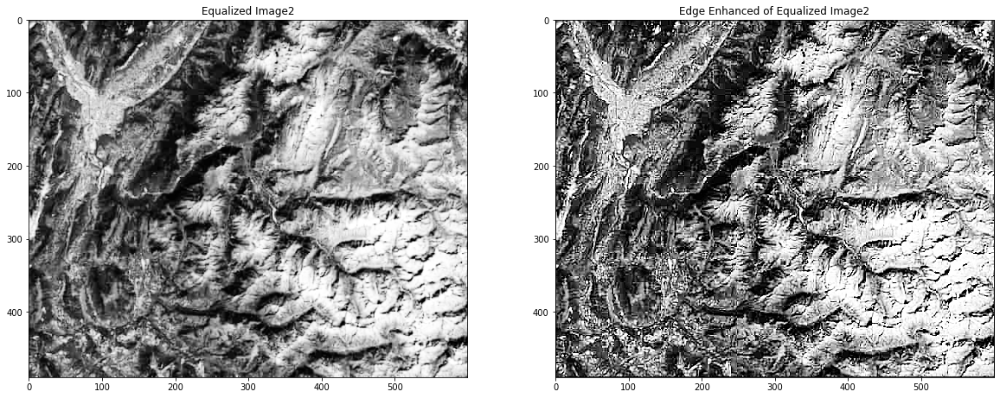

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.title("Equalized Image2")
plt.imshow(EqualizedImage2,cmap='gray',vmin=0,vmax=255)
plt.subplot(1,2,2)
EdgeEnhanced2=EdgeEnhancement(EqualizedImage2)
plt.title("Edge Enhanced of Equalized Image2")
plt.imshow(EdgeEnhanced2,cmap='gray',vmin=0,vmax=255)

In [ ]:
def Horizontal(img):
  #img2=img.copy()
  img2=np.zeros(img.shape)
  filter=np.array([[-1,-2,-1],[0,0,0],[1,2,1]])#horizontal filter
  for i in range(1,img.shape[0]-1):
    for j in range(1,img.shape[1]-1):
      img2[i,j]=np.multiply(img[i-1:i+2,j-1:j+2],filter).sum()
  return img2
def Vertical(img):
  #img2=img.copy()
  img2=np.zeros(img.shape)
  filter=np.array([[-1,0,1],[-2,0,2],[-1,0,1]])#vertical filter
  for i in range(1,img.shape[0]-1):
    for j in range(1,img.shape[1]-1):
      img2[i,j]=(img[i-1:i+2,j-1:j+2]*filter).sum()#multiplying orignal image and filter
  return img2
def Diagonal(img):
  #img2=img.copy()
  img2=np.zeros(img.shape)
  filter=np.array([[0,1,2],[-1,0,1],[-2,-1,0]])#horizontal mask
  for i in range(1,img.shape[0]-1):
    for j in range(1,img.shape[1]-1):
      img2[i,j]=np.multiply(img[i-1:i+2,j-1:j+2],filter).sum()#multiplying orignal image and filter
  return img2
def EdgeDetection(img):
  hor=Horizontal(img)
  ver=Vertical(img)
  dia=Diagonal(img)
  final=hor+ver+dia#adding horizontal vertical and diagonal components

  return final

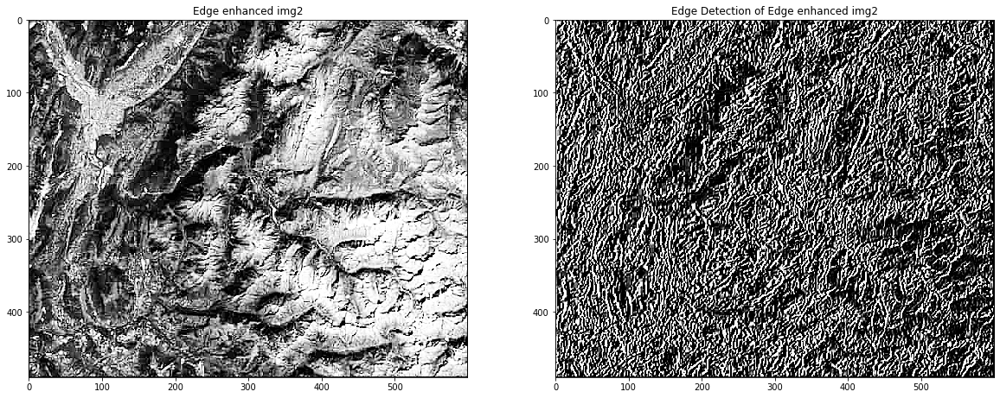

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.title("Edge enhanced img2")
plt.imshow(EdgeEnhanced2,cmap='gray',vmin=0,vmax=255)
plt.subplot(1,2,2)
Edge2=EdgeDetection(EdgeEnhanced2)
plt.title("Edge Detection of Edge enhanced img2")
# kernel=np.ones((2,1))
# Edge2=cv2.dilate(Edge2,kernel,iterations=1)
plt.imshow(Edge2,cmap='gray',vmin=0,vmax=255)

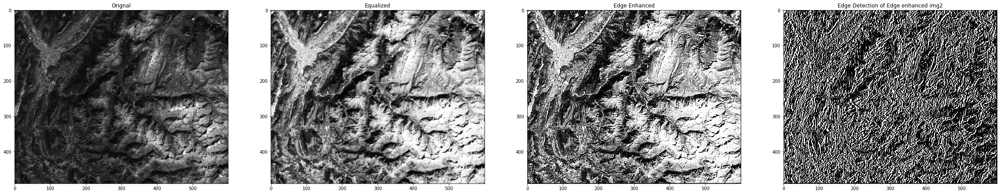

In [ ]:
plt.figure(figsize=(40,40))
plt.subplot(1,4,1)
plt.title("Orignal")
plt.imshow(img2,cmap='gray',vmin=0,vmax=255)
plt.subplot(1,4,2)
plt.title("Equalized")
plt.imshow(EqualizedImage2,cmap='gray',vmin=0,vmax=255)
plt.subplot(1,4,3)
plt.title("Edge Enhanced")
plt.imshow(EdgeEnhanced2,cmap='gray',vmin=0,vmax=255)
plt.subplot(1,4,4)
Edge2=EdgeDetection(EdgeEnhanced2)
plt.title("Edge Detection of Edge enhanced img2")
# kernel=np.ones((2,1))
# Edge2=cv2.dilate(Edge2,kernel,iterations=1)
plt.imshow(Edge2,cmap='gray',vmin=0,vmax=255)

In [ ]:
def skeleton(img):
  #img2=img.copy()
  img2=np.zeros(img.shape)
  filter=np.array(np.zeros((7,11))) # filter of 7 rows 11 columns
  filter[2,3]=1
  filter[2,7]=1
  filter[3,4]=1
  filter[3,5]=1
  filter[3,6]=1
  filter[4,3]=1
  filter[4,7]=1
  m,n=7,11
  # print(filter)
  for i in range(m,img.shape[0]-m):
    for j in range(n,img.shape[1]-n):
      img2[i,j]=(img[i-m//2:i+m//2+1,j-n//2:j+n//2+1]*filter).sum()#multiplying orignal image and filter
  return img2

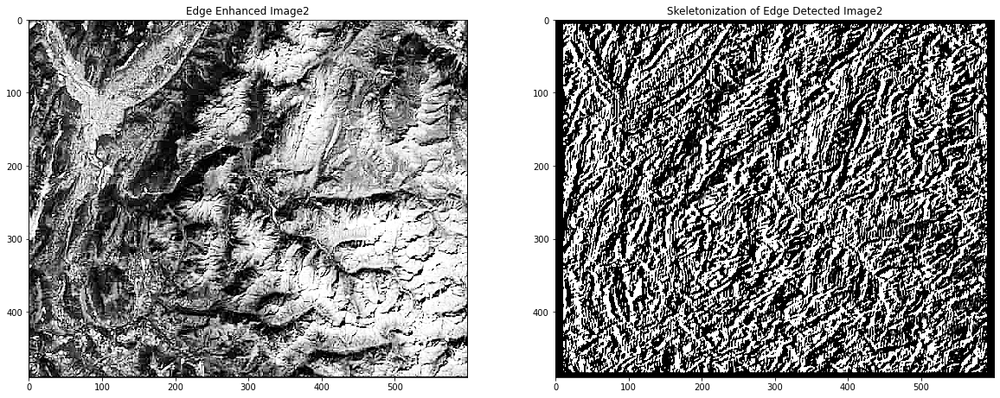

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.title("Edge Enhanced Image2")
plt.imshow(EdgeEnhanced2,cmap='gray',vmin=0,vmax=255)
plt.subplot(1,2,2)
plt.title("Skeletonization of Edge Detected Image2")
plt.imshow(skeleton(Edge2),cmap='gray',vmin=0,vmax=255)

In [ ]:
def edge(img):
  #img2=img.copy()
  img2=np.zeros(img.shape)
  filter=np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])#vertical filter
  for i in range(1,img.shape[0]-1):
    for j in range(1,img.shape[1]-1):
      img2[i,j]=(img[i-1:i+2,j-1:j+2]*filter).sum()#multiplying orignal image and filter
  return img2

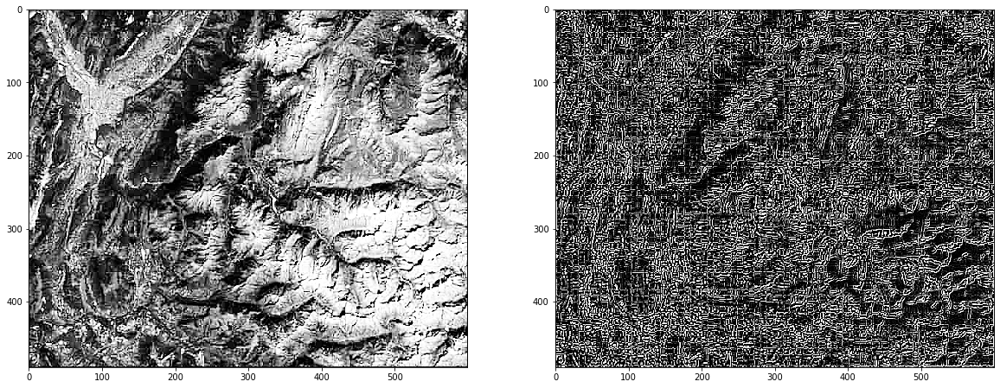

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.imshow(EdgeEnhanced2,cmap='gray',vmin=0,vmax=255)
plt.subplot(1,2,2)
Edge2=edge(EdgeEnhanced2)
kernel=np.ones((1,1))
Edge2=cv2.dilate(Edge2,kernel,iterations=1)
plt.imshow(Edge2,cmap='gray',vmin=0,vmax=255)

In [ ]:
path='/content/drive/MyDrive/Sem 4/Projects/SIP/Chin_Ind_AP_sattelite.png'
img=cv2.imread(path,0)
img.shape

(800, 1512)

In [ ]:
dim=(512,512)
resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
img=resized

#Image 2

Text(0.5, 1.0, 'Original Image')

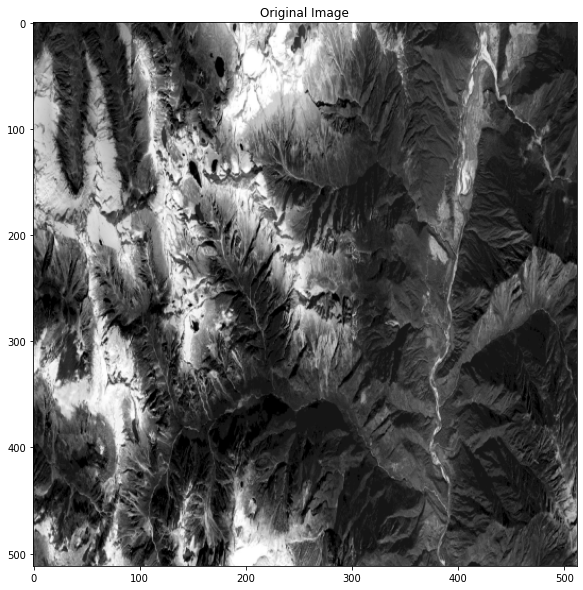

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(img,cmap='gray')
plt.title("Original Image")

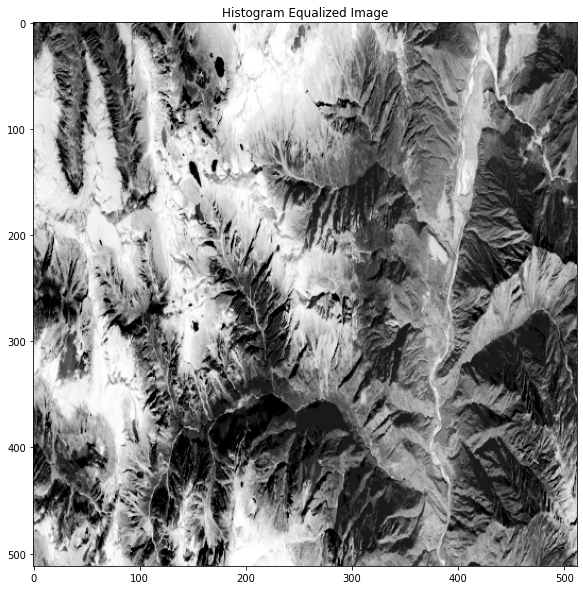

In [ ]:
equ=cv2.equalizeHist(img)
plt.figure(figsize=(10,10))
plt.title("Histogram Equalized Image")
plt.imshow(equ,cmap='gray')

In [ ]:
def EdgeEnhancement(img):
  #img2=img.copy()
  img2=np.zeros(img.shape)
  filter=np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])#horizontal filter
  for i in range(1,img.shape[0]-1):
    for j in range(1,img.shape[1]-1):
      img2[i,j]=np.multiply(img[i-1:i+2,j-1:j+2],filter).sum()
  return img2

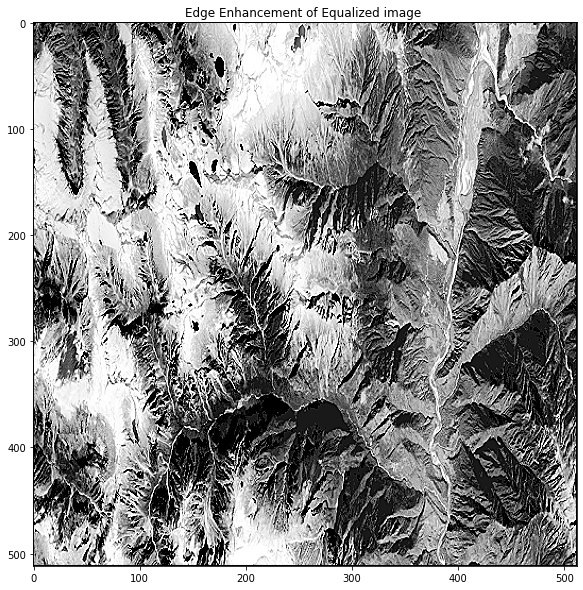

In [ ]:
enhance=EdgeEnhancement(equ)
plt.figure(figsize=(10,10))
plt.title("Edge Enhancement of Equalized image ")
plt.imshow(enhance,cmap='gray',vmin=0,vmax='255')

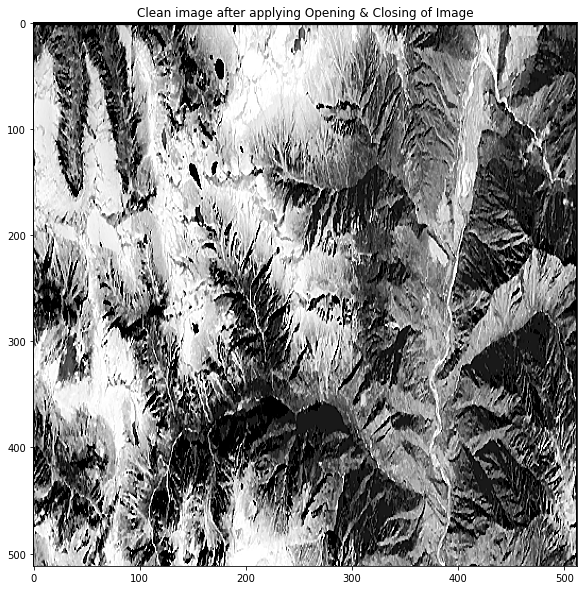

In [ ]:
kernel=np.ones((2,1))#structuring element
clean=cv2.erode(cv2.dilate(cv2.dilate(cv2.erode(enhance,kernel),kernel),kernel),kernel)  # opening and then closing the Edge Enhancement equalized image
# we remove the noise after doing the above code line
# clean=cv2.erode(cv2.dilate(cv2.dilate(cv2.erode(clean,kernel),kernel),kernel),kernel)
plt.figure(figsize=(10,10))
plt.title("Clean image after applying Opening & Closing of Image")
plt.imshow(clean,cmap='gray',vmin=0,vmax='255')

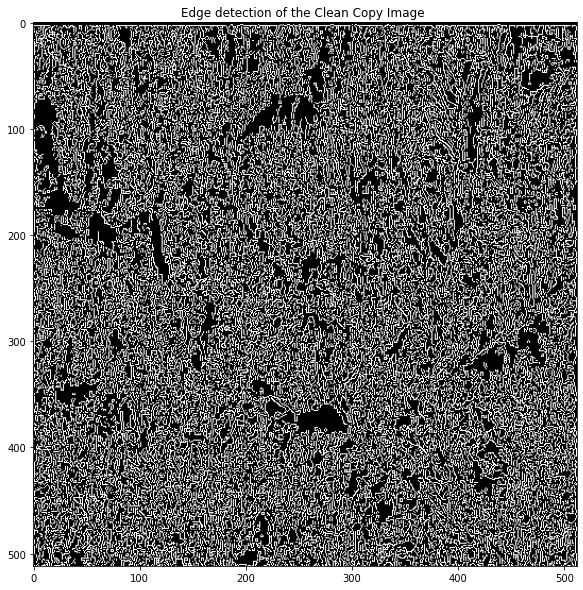

In [ ]:
# changing the number format because canny wasnt working therefore we used this
cleanCopy = np.uint8(clean)
filterd=cv2.Canny(cleanCopy,0,255)#edge detection
plt.figure(figsize=(10,10))
plt.title("Edge detection of the Clean Copy Image ")
plt.imshow(filterd,cmap='gray')

#Conclusion:
We have tried to use image processing techniques to detect drainagee channel networks using digital sattilite images. We first apply contrast streching using histogram equalization and obtained a better image, next we try and enchance the edges by suing a mask provided in the paper. The reuslts are evidently visable. Next we have to use edge detection to find the drainage channel but here we run into an issue. As the  peaks and valleys are 1 or 2 pixels we end up with quasi parrallel lines after application of edge detection which does not give a desiraable result. The paper suggest that we fill up the space in between these lines but we have not been able to implement this thus far. We have further applied the next step suggested by the paper which is skeletonization. But as edge detection failed this did not yeild desirable results as well. We tried doiong this whole process using cv2 provided functions. For this process we took a screenshot from google earth hoping to obtain a better result. But to no awail we also carried the process of opening and closing in hopes to remove noise but the results were not significant.